In [1]:
#!/usr/bin/env python
# coding: utf-8

# # Creating an optimisation with meta parameters
# 
# This notebook will explain how to set up an optimisation that uses metaparameters (parameters that control other parameters)


import bluepyopt as bpop
import bluepyopt.ephys as ephys
import pickle
from sciunit.scores import ZScore
from sciunit import TestSuite
from sciunit.scores.collections import ScoreArray
import sciunit
import numpy as np
from neuronunit.optimisation.optimization_management import dtc_to_rheo, switch_logic,active_values
from neuronunit.tests.base import AMPL, DELAY, DURATION

import quantities as pq
PASSIVE_DURATION = 500.0*pq.ms
PASSIVE_DELAY = 200.0*pq.ms
import matplotlib.pyplot as plt
from bluepyopt.ephys.models import ReducedCellModel
import numpy
from neuronunit.optimisation.optimization_management import test_all_objective_test
from neuronunit.optimisation.optimization_management import check_binary_match, three_step_protocol,inject_and_plot_passive_model
from neuronunit.optimisation.model_parameters import MODEL_PARAMS

#MODEL_PARAMS["IZHI"].pop('C',None)
#MODEL_PARAMS["IZHI"].pop('k',None)
#MODEL_PARAMS["IZHI"].pop('vPeak',None)
#MODEL_PARAMS["IZHI"].pop('vt',None)
#MODEL_PARAMS["IZHI"].pop('a',None)
#MODEL_PARAMS["IZHI"].pop('d',None)
#MODEL_PARAMS["IZHI"].pop('vr',None)
#MODEL_PARAMS["IZHI"].pop('c',None)


import numpy as np


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# First we need to import the module that contains all the functionality to create electrical cell models

# If you want to see a lot of information about the internals, 
# the verbose level can be set to 'debug' by commenting out
# the following lines

# Setting up the cell
# ---------------------
# This is very similar to the simplecell example in the directory above. For a more detailed explanation, look there.

# For this example we will create two separate parameters to store the specific capacitance. One for the soma and one for the soma. We will put a metaparameter on top of these two to keep the value between soma and axon the same.

# The metaparameter, the one that will be optimised, will make sure the two parameters above keep always the same value

# And parameters that represent the maximal conductance of the sodium and potassium channels. These two parameters will be not be optimised but are frozen.

# ### Creating the template
# 
# To create the cell template, we pass all these objects to the constructor of the template.
# We *only* put the metaparameter, not its subparameters.


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# Now we can print out a description of the cell

model = simple_cell
model.params = {k:np.mean(v) for k,v in model.params.items() }


from sciunit.scores import ZScore
tests = pickle.load(open("processed_multicellular_constraints.p","rb"))
nu_tests = tests['Hippocampus CA1 pyramidal cell'].tests
nu_tests[0].score_type = ZScore

simulated_experiment = True
features = None
allen = True
if simulated_experiment:
    while features is None:
        aug_nu_tests, OM, target = test_all_objective_test(MODEL_PARAMS["IZHI"],model_type="IZHI",protocol={'allen':False,'elephant':True})
        target = three_step_protocol(target)
        if hasattr(target,'everything'):
            #if hasattr(target,'allen_15'):
            features = target.everything
            if allen:
                simple_cell.allen = None
                simple_cell.allen = True

                tests = pickle.load(open("allen_NU_tests.p","rb"))
                print('allen cell',tests[0].name)
                nu_tests = tests[0]
                for t in nu_tests:                    
                    if t.name in features.keys():
                        if features[t.name] is not None:
                            t.set_observation(features[t.name])
                            if t.observation['mean'] is not None:
                                t.observation['std'] = np.abs(np.mean(t.observation['mean']))
                features['vr']
                #nu_tests.append()






/home/user/anaconda3/lib/python3.7/site-packages/airspeed/__init__.py:505: FutureWarning: Possible nested set at position 8
  KEYVALSEP = re.compile(r'[ \t]*:[[ \t]*(.*)$', re.S)


Random simulated data tests made
{'value': array(157.31477737) * pA}
{'value': array(3.55480677) * ms}
{'mean': array(-65.82536127) * mV, 'std': array(0.) * mV}
{'value': array(40306091.42544249) * kg*m**2/(s**3*A**2)}
{'value': array(8.81952739e-11) * s**4*A**2/(kg*m**2)}
{'mean': array(0.0005) * s, 'std': array(0.) * s, 'n': 1}
{'value': array(60.46934008) * mV, 'mean': array(60.46934008) * mV, 'std': array(0.) * mV, 'n': 1}
{'mean': array(-12.99234056) * mV, 'std': array(0.) * mV, 'n': 1}
allen cell 504615116


In [2]:
#for tt in nu_tests:
#    feature_name = '%s' % (tt.name)
#    print(feature_name)
import efel
list(efel.getFeatureNames())

['AHP1_depth_from_peak',
 'AHP2_depth_from_peak',
 'AHP_depth',
 'AHP_depth_abs',
 'AHP_depth_abs_slow',
 'AHP_depth_diff',
 'AHP_depth_from_peak',
 'AHP_slow_time',
 'AHP_time_from_peak',
 'AP1_amp',
 'AP1_begin_voltage',
 'AP1_begin_width',
 'AP1_peak',
 'AP1_width',
 'AP2_AP1_begin_width_diff',
 'AP2_AP1_diff',
 'AP2_AP1_peak_diff',
 'AP2_amp',
 'AP2_begin_voltage',
 'AP2_begin_width',
 'AP2_peak',
 'AP2_width',
 'AP_amplitude',
 'AP_amplitude_change',
 'AP_amplitude_diff',
 'AP_amplitude_from_voltagebase',
 'AP_begin_indices',
 'AP_begin_time',
 'AP_begin_voltage',
 'AP_begin_width',
 'AP_duration',
 'AP_duration_change',
 'AP_duration_half_width',
 'AP_duration_half_width_change',
 'AP_end_indices',
 'AP_fall_indices',
 'AP_fall_rate',
 'AP_fall_rate_change',
 'AP_fall_time',
 'AP_height',
 'AP_phaseslope',
 'AP_phaseslope_AIS',
 'AP_rise_indices',
 'AP_rise_rate',
 'AP_rise_rate_change',
 'AP_rise_time',
 'AP_width',
 'APlast_amp',
 'APlast_width',
 'BAC_maximum_voltage',
 'BAC_w

In [3]:

from collections.abc import Iterable

class NUFeatureAllen(object):
    def __init__(self,test,model):
        self.test = test
        self.model = model
    def calculate_score(self,responses):
        if not 'features' in responses.keys():# or not 'model' in responses.keys():
            return 100.0
        check_list = [ 
             'interburst_voltage',
            'inv_fifth_ISI',
            'inv_first_ISI',
            'inv_fourth_ISI',
            'inv_last_ISI',
            'inv_second_ISI',
            'inv_third_ISI',
            'amp_drop_first_last',
            'amp_drop_first_second',
            'amp_drop_second_last',
            'burst_ISI_indices',
            'burst_mean_freq',
            'burst_number',
            'time_to_first_spike',
                    'time_to_last_spike',
                    'time_to_second_spike',
                    'voltage_after_stim',
                      'decay_time_constant_after_stim',
                      'steady_state_voltage_stimend',
                      'voltage_deflection',
                      'AP1_amp',
                      'AP2_amp',
                      'AP_height',
                      'AP_amplitude_from_voltagebase'
                      'min_voltage_between_spikes',
                      'minimum_voltage',
                      'peak_voltage',
                      'max_amp_difference',
                      'voltage_deflection',
                      'AP1_amp',
                      'AP2_amp',
                      'AP_height',
            
                      'AP_amplitude_from_voltagebase'
                      'min_voltage_between_spikes',
                      'minimum_voltage',
                      'peak_voltage',
                      'max_amp_difference',
                      'maximum_voltage',
                      'maximum_voltage_from_voltagebase',
                      'voltage_base_3.0x',
                      'depolarized_base_3.0x',
                      'voltage_base_1.5x',
                      'AP_duration_half_width_1.5x',
                      'number_initial_spikes_3.0x',
                      'AP2_width_3.0x',
                      'AP2_begin_voltage_1.5x'
                      'decay_time_constant_after_stim_1.5x',
                      'time_constant_1.5x',
                      'decay_time_constant_after_stim_1.5x',
                      'AP2_begin_voltage_1.5x',
                      'ISI_log_slope_3.0x',
                      'inv_third_ISI_3.0x',
                      'AP_fall_rate_change_3.0x',
                      'adaptation_index_3.0x',
                      'irregularity_index',
                      'max_amp_difference',
                      'maximum_voltage',
                      'maximum_voltage_from_voltagebase',
                      'mean_AP_amplitude',
                    'AHP_depth',
                    'AHP_depth_abs',
                    'AHP_depth_abs_slow',
                    'AHP_depth_diff',
                    'AHP_depth_from_peak',
                    'AHP_slow_time',
                    'sag_amplitude',
                    'sag_ratio1',
                    'sag_ratio2']
        features = responses['features']
        feature_name = self.test.name
        if feature_name not in features.keys():
            return 100.0
        
        if features[feature_name] is None:
            return 100.0
            
        if type(features[self.test.name]) is type(Iterable):
            features[self.test.name] = np.mean(features[self.test.name])
        self.test.observation['std'] = np.abs(np.mean(self.test.observation['mean']))
        self.test.observation['mean'] = np.mean(self.test.observation['mean'])            
        self.test.set_prediction(np.mean(features[self.test.name]))
        
        if 'Spikecount_3.0x'==self.test.name or 'Spikecount_1.5x'==self.test.name:
            if features[feature_name] is None:
                #print(features[feature_name],feature_name)
                return 100.0
            delta = np.abs(features[self.test.name]-np.mean(self.test.observation['mean']))
            #print(delta)

            
            return delta
        else:
            
            if 'spike_width2_3.0x' ==self.test.name or 'AHP_time_from_peak_3.0x'==self.test.name:
                if features[self.test.name] is None:

                    return 100.0
                score_gene = self.test.feature_judge()#,np.mean(self.test.observation['mean']))
                if score_gene is not None:
                    if score_gene.raw is not None:

                        delta = np.abs(float(score_gene.raw))
                    else:
                        delta = np.abs(features[feature_name]-np.mean(self.test.observation['mean']))
                else:
                    delta = np.abs(features[feature_name]-np.mean(self.test.observation['mean']))

                if np.isnan(delta):

                    delta = 100.0

                if delta is None:

                    delta = 100.0                      
                score = 0.0125*delta
                try:
                    assert score<=1.0
                except:
                    print(feature_name)
                    print(feature_name,'alter key 100')

    
                    
                return score
 
            if feature_name in check_list:
                if features[feature_name] is None:
                    return 100.0
                score_gene = self.test.feature_judge()#,np.mean(self.test.observation['mean']))
                if score_gene is not None:
                    if score_gene.raw is not None:

                        delta = np.abs(float(score_gene.raw))
                    else:
                        delta = np.abs(features[feature_name]-np.mean(self.test.observation['mean']))
                else:
                    delta = np.abs(features[feature_name]-np.mean(self.test.observation['mean']))

                if np.isnan(delta):

                    delta = 100.0
                if delta is None:

                    delta = 100.0
                score = 0.0125*delta
                try:
                    assert score<=1.0
                except:
                    print(feature_name)
                    print(feature_name,'alter key 100')

                    
                return score

        print(feature_name,'\n\n\n\n leaked case \n\n\n\n')


objectives = []
   



check_list =['Spikecount_3.0x','Spikecount_1.5x','spike_width2_3.0x','AHP_time_from_peak_3.0x',\
                'number_initial_spikes_3.0x','AP2_width_3.0x',]
check_list2 = [    
                'interburst_voltage',
                'inv_fifth_ISI',
                'inv_first_ISI',
                'inv_fourth_ISI',
                'inv_last_ISI',
                'inv_second_ISI',
                'inv_third_ISI',
                'amp_drop_first_last',
                'amp_drop_first_second',
                'amp_drop_second_last',
                'burst_ISI_indices',
                'burst_mean_freq',
                'burst_number',
                    'time_to_first_spike',
                    'time_to_last_spike',
                    'time_to_second_spike',
                    'voltage_after_stim',
                      'decay_time_constant_after_stim',
                      'steady_state_voltage_stimend',
                      'voltage_deflection',
                      'AP1_amp',
                      'AP2_amp',
                      'AP_height',
                      'AP_amplitude_from_voltagebase'
                      'min_voltage_between_spikes',
                      'minimum_voltage',
                      'peak_voltage',
                      'max_amp_difference',
                      'voltage_deflection',
                      'AP1_amp',
                      'AP2_amp',
                      'AP_height',
                      'AP_amplitude_from_voltagebase',
                'voltage_base_3.0x','depolarized_base_3.0x','voltage_base_1.5x',\
               'AP_duration_half_width_1.5x','number_initial_spikes_3.0x','AP2_width_3.0x',\
               'AP2_begin_voltage_1.5x','decay_time_constant_after_stim_1.5x',\
               'time_constant_1.5x','ISI_log_slope_3.0x','inv_third_ISI_3.0x',
               'AP_fall_rate_change_3.0x',
               'irregularity_index',
               'max_amp_difference',
                  'maximum_voltage',
                  'maximum_voltage_from_voltagebase',
                  'mean_AP_amplitude',
                  'mean_frequency','adaptation_index_3.0x','min_voltage_between_spikes',
                      'minimum_voltage',
                      'peak_voltage',
                      'max_amp_difference',
                      'maximum_voltage',
                      'maximum_voltage_from_voltagebase',
                    'AHP_depth',
                    'AHP_depth_abs',
                    'AHP_depth_abs_slow',
                    'AHP_depth_diff',
                    'AHP_depth_from_peak',
                    'AHP_slow_time',
                    'sag_amplitude',
                    'sag_ratio1',
                    'sag_ratio2',
                    ]
check_list.extend(check_list2)
for tt in nu_tests:
    feature_name = '%s' % (tt.name)
    if feature_name in check_list:
        print(feature_name)
        #if 'Spikecount_3.0x' in tt.name or 'Spikecount_1.5x'in tt.name or 'spike_width2_3.0x' in tt.name or 'AHP_time_from_peak_3.0x' in tt.name:# or 'isi' in tt.name or 'cv' in tt.name:
        ft = NUFeatureAllen(tt,model)
        objective = ephys.objectives.SingletonObjective(
            feature_name,
            ft)
        objectives.append(objective)


        
score_calc = ephys.objectivescalculators.ObjectivesCalculator(objectives) 
        
        
#objectives[0]        



# ### Creating the cell evaluator
# 
# We will need an object that can use these objective definitions to calculate the scores from a protocol response. This is called a ScoreCalculator.




lop={}
from bluepyopt.parameters import Parameter
for k,v in MODEL_PARAMS["IZHI"].items():
    p = Parameter(name=k,bounds=v,frozen=False)
    lop[k] = p

print(lop)
simple_cell.params = lop



AP2_begin_voltage_1.5x
Spikecount_1.5x
voltage_base_1.5x
decay_time_constant_after_stim_1.5x
AP_duration_half_width_1.5x
time_constant_1.5x
Spikecount_3.0x
voltage_base_3.0x
spike_width2_3.0x
AHP_time_from_peak_3.0x
AP2_width_3.0x
AP_fall_rate_change_3.0x
depolarized_base_3.0x
number_initial_spikes_3.0x
inv_third_ISI_3.0x
ISI_log_slope_3.0x
adaptation_index_3.0x
{'C': <bluepyopt.parameters.Parameter object at 0x7f497412bf90>, 'k': <bluepyopt.parameters.Parameter object at 0x7f4974187e50>, 'vr': <bluepyopt.parameters.Parameter object at 0x7f4974187bd0>, 'vt': <bluepyopt.parameters.Parameter object at 0x7f4974187d90>, 'vPeak': <bluepyopt.parameters.Parameter object at 0x7f49741878d0>, 'a': <bluepyopt.parameters.Parameter object at 0x7f4974187a10>, 'b': <bluepyopt.parameters.Parameter object at 0x7f49741874d0>, 'c': <bluepyopt.parameters.Parameter object at 0x7f4974187850>, 'd': <bluepyopt.parameters.Parameter object at 0x7f4974187310>}


In [4]:


# Combining everything together we have a CellEvaluator. The CellEvaluator constructor has a field 'parameter_names' which contains the (ordered) list of names of the parameters that are used as input (and will be fitted later on).
sweep_protocols = []
for protocol_name, amplitude in [('step1', 0.05)]:

    protocol = ephys.protocols.SweepProtocol(protocol_name, [None], [None])
    sweep_protocols.append(protocol)
twostep_protocol = ephys.protocols.SequenceProtocol('twostep', protocols=sweep_protocols)

MODEL_PARAMS["IZHI"]
cell_evaluator = ephys.evaluators.CellEvaluator(
        cell_model=simple_cell,
        param_names=MODEL_PARAMS["IZHI"].keys(),
        fitness_protocols={twostep_protocol.name: twostep_protocol},
        fitness_calculator=score_calc,
        sim='euler')
simple_cell.params_by_names(MODEL_PARAMS["IZHI"].keys())
simple_cell.params;



# ## Setting up and running an optimisation
# 
# Now that we have a cell template and an evaluator for this cell, we can set up an optimisation.
import dask
def dask_map_function(eval_,invalid_ind):
    results = []
    for x in invalid_ind:
        y = dask.delayed(eval_)(x)
        results.append(y)
    fitnesses = dask.compute(*results)
    return fitnesses



MU = 30
optimisation = bpop.optimisations.DEAPOptimisation(
        evaluator=cell_evaluator,
        offspring_size = MU,
        map_function = dask_map_function,
        selector_name='IBEA',mutpb=1,cxpb=1)



# And this optimisation can be run for a certain number of generations



final_pop, hall_of_fame, logs, hist = optimisation.run(max_ngen=50)




INFO:__main__:gen	nevals	avg    	std    	min    	max 
1  	30    	369.654	609.525	7.28399	1700


decay_time_constant_after_stim_1.5x
decay_time_constant_after_stim_1.5x alter key 100


INFO:__main__:2  	30    	363.968	601.201	7.28399	1700
INFO:__main__:3  	30    	128.693	359.567	7.28399	1700


decay_time_constant_after_stim_1.5x
decay_time_constant_after_stim_1.5x alter key 100


INFO:__main__:4  	30    	139.175	362.727	1.2789 	1700
INFO:__main__:5  	30    	74.0931	220.036	1.2789 	1700
INFO:__main__:6  	30    	226.66 	535.758	1.2789 	1700
INFO:__main__:7  	30    	76.4823	301.402	1.2789 	1700
INFO:__main__:8  	30    	95.6883	365.599	1.2789 	1700
INFO:__main__:9  	30    	67.9387	301.286	1.27123	1700
INFO:__main__:10 	30    	9.69586	9.95075	1.27123	44.2723
INFO:__main__:11 	30    	112.169	363.08 	1.27123	1700   
INFO:__main__:12 	30    	123.944	417.779	1.27123	1700   
INFO:__main__:13 	30    	12.0687	11.0789	0.263107	44.3799


decay_time_constant_after_stim_1.5x
decay_time_constant_after_stim_1.5x alter key 100


INFO:__main__:14 	30    	80.831 	298.902	0.263107	1700   
INFO:__main__:15 	30    	77.7282	301.181	0.263107	1700   
INFO:__main__:16 	30    	96.7598	365.273	0.263107	1700   
INFO:__main__:17 	30    	94.5287	365.796	0.263107	1700   
INFO:__main__:18 	30    	103.477	367.572	0.263107	1700   
INFO:__main__:19 	30    	174.654	504.17 	0.263107	1700   
INFO:__main__:20 	30    	173.754	504.225	0.263107	1700   
INFO:__main__:21 	30    	91.0937	366.076	0.263107	1700   
INFO:__main__:22 	30    	102.017	369.581	0.263107	1700   
INFO:__main__:23 	30    	149.452	464.157	0.263107	1700   
INFO:__main__:24 	30    	147.847	463.949	0.263107	1700   
INFO:__main__:25 	30    	149.811	464.073	0.263107	1700   
INFO:__main__:26 	30    	145.684	464.723	0.263107	1700   
INFO:__main__:27 	30    	34.1243	215.272	0.263107	1700   
INFO:__main__:28 	30    	200.963	539.83 	0.263107	1700   
INFO:__main__:29 	30    	64.9519	301.801	0.263107	1700   
INFO:__main__:30 	30    	150.852	463.698	0.263107	1700   
INFO:__main__:

{'AP2_begin_voltage_1.5x': 0.000886, 'Spikecount_1.5x': 0.0, 'voltage_base_1.5x': 0.000305, 'decay_time_constant_after_stim_1.5x': 0.000273, 'AP_duration_half_width_1.5x': 0.00133825, 'time_constant_1.5x': 0.25, 'Spikecount_3.0x': 0.0, 'voltage_base_3.0x': 0.000305, 'spike_width2_3.0x': 0.00107275, 'AHP_time_from_peak_3.0x': 3.33e-17, 'AP2_width_3.0x': 0.00028875, 'AP_fall_rate_change_3.0x': 0.0026475, 'depolarized_base_3.0x': 0.00044374999999999997, 'number_initial_spikes_3.0x': 0.00083325, 'inv_third_ISI_3.0x': 0.0019370000000000001, 'ISI_log_slope_3.0x': 0.0016150000000000001, 'adaptation_index_3.0x': 0.0011612500000000002}


[-73.85645772] mV [-65.82536127] mV


(0.2367958500000001, 8.012387955000001)

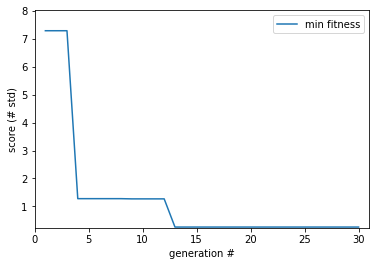

In [5]:


# The optimisation has return us 4 objects: final population, hall of fame, statistical logs and history. 
# 
# The final population contains a list of tuples, with each tuple representing the two parameters of the model


#print('Final population: ', final_pop)


# The best individual found during the optimisation is the first individual of the hall of fame

best_ind = hall_of_fame[0]
#print('Best individual: ', best_ind)
#print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
cell_evaluator.param_dict(best_ind)
model.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}



opt = model.model_to_dtc()
opt.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}

check_binary_match(target,opt)
inject_and_plot_passive_model(opt,second=target)


# As you can see the evaluation returns the same values as the fitness values provided by the optimisation output. 
# We can have a look at the responses now.

# In[ ]:


#plot_responses(twostep_protocol.run(cell_model=simple_cell, param_values=best_ind_dict, sim=nrn))
 


# Let's have a look at the optimisation statistics.
# We can plot the minimal score (sum of all objective scores) found in every optimisation. 
# The optimisation algorithm uses negative fitness scores, so we actually have to look at the maximum values log.

gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
plt.plot(gen_numbers, min_fitness, label='min fitness')
plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 


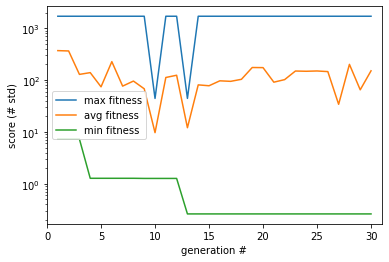

In [6]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
plt.plot(gen_numbers, max_fitness, label='max fitness')
plt.plot(gen_numbers, avg_fitness, label='avg fitness')
plt.plot(gen_numbers, min_fitness, label='min fitness')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.yscale('log')

plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()


<Figure size 432x288 with 0 Axes>

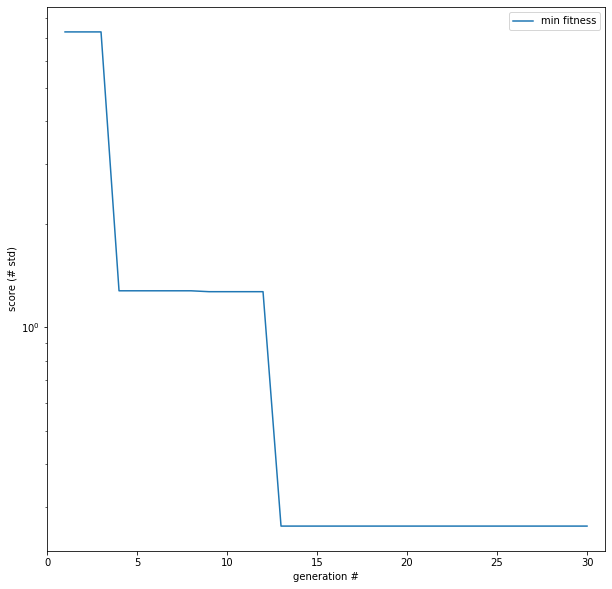

In [7]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
fig = plt.figure(figsize=(10,10))
#ax = fig.add_subplot(1,1)

plt.plot(gen_numbers, min_fitness, label='min fitness')
#ax.semilogy()
#ax.set_yscale('log')
plt.yscale('log')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()

[-73.85645772] mV [-65.82536127] mV


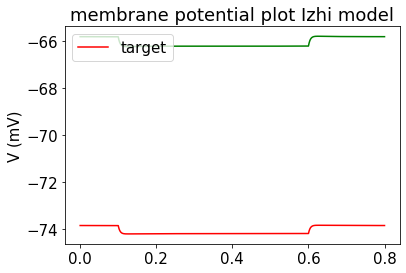

In [8]:
inject_and_plot_passive_model(opt,second=target,plotly=False)
best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

In [9]:
best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

model = cell_evaluator.cell_model
cell_evaluator.param_dict(best_ind)
model.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}

opt = model.model_to_dtc()
opt.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}
from neuronunit.optimisation.optimization_management import dtc_to_rheo, inject_and_plot_model30,check_bin_vm30,check_bin_vm15
opt = dtc_to_rheo(opt)
opt.rheobase
opt.attrs;
vm301,vm151,_,_,target = inject_and_plot_model30(target)
vm302,vm152,_,_,opt = inject_and_plot_model30(opt)


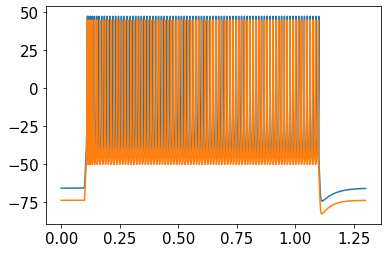

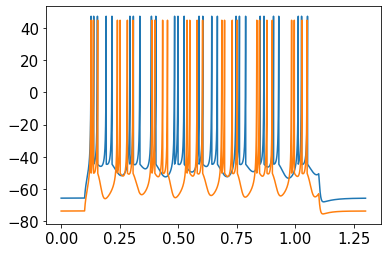

In [10]:
from neuronunit.optimisation.optimization_management import dtc_to_rheo, inject_and_plot_model30,check_bin_vm30,check_bin_vm15
check_bin_vm30(target,opt)
check_bin_vm15(target,opt)






In [22]:
def basic_expVar(trace1, trace2):
    # https://github.com/AllenInstitute/GLIF_Teeter_et_al_2018/blob/master/query_biophys/query_biophys_expVar.py
    '''This is the fundamental calculation that is used in all different types of explained variation.  
    At a basic level, the explained variance is calculated between two traces.  These traces can be PSTH's
    or single spike trains that have been convolved with a kernel (in this case always a Gaussian)
    Input:
        trace 1 & 2:  1D numpy array containing values of the trace.  (This function requires numpy array
                        to ensure that this is not a multidemensional list.)
    Returns:
        expVar:  float value of explained variance
    '''
    
    var_trace1=np.var(trace1)
    var_trace2=np.var(trace2)
    var_trace1_minus_trace2=np.var(trace1-trace2)

    if var_trace1_minus_trace2 == 0.0:
        return 1.0
    else:
        return (var_trace1+var_trace2-var_trace1_minus_trace2)/(var_trace1+var_trace2)
print(basic_expVar(target.vm15, opt.vm15))
print(basic_expVar(target.vm30, opt.vm30))

0.41157250983970645 dimensionless
0.5708916931529815 dimensionless


In [11]:
opt = dtc_to_rheo(opt)
print(opt.rheobase)
print(target.rheobase)


185.23603118417213 pA
157.31477737426758 pA


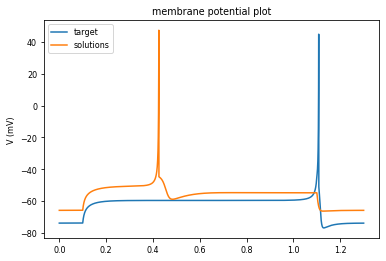

<Figure size 432x288 with 0 Axes>

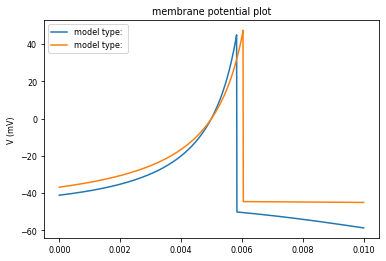

In [12]:

check_binary_match(opt,target,plotly=False,snippets=False)
check_binary_match(opt,target,plotly=False,snippets=True)


In [13]:
params = {}
params['injected_square_current'] = {}
#if v.name in str('RestingPotentialTest'):
params['injected_square_current']['delay'] = PASSIVE_DELAY
params['injected_square_current']['duration'] = PASSIVE_DURATION
params['injected_square_current']['amplitude'] = 0.0*pq.pA    

In [14]:

opt_model = opt.dtc_to_model()
opt_model.inject_square_current(params)
opt_vm = opt_model.get_membrane_potential()
opt_vm[-1]

array([-73.85645772]) * mV

In [15]:
target_model = target.dtc_to_model()
target_model.inject_square_current(params)
target_vm = target_model.get_membrane_potential()
target_vm[-1]

array([-65.82536127]) * mV

In [16]:
best_ind = hall_of_fame[1]
print('Best individual: ', best_ind)
print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
dtc= model.model_to_dtc()
opt = dtc_to_rheo(opt)
print(opt.rheobase)


Best individual:  [125.85249011388146, 1.0862690206672418, -73.8564577215949, -49.41502952379876, 44.99502479377917, 0.028121895194025925, 1.5298406600619088, -50.039883215211624, 127.66250503333089]
Fitness values:  (0.0010085, 0.0, 0.000305, 9.0525e-05, 0.0012295000000000001, 0.25, 0.0, 0.000305, 0.00062175, 1.204e-16, 0.00245825, 0.0060925, 0.000438, 0.00041674999999999997, 0.0003885, 0.0007227500000000001, 7.345e-05)
{'AP2_begin_voltage_1.5x': 0.0010085, 'Spikecount_1.5x': 0.0, 'voltage_base_1.5x': 0.000305, 'decay_time_constant_after_stim_1.5x': 9.0525e-05, 'AP_duration_half_width_1.5x': 0.0012295000000000001, 'time_constant_1.5x': 0.25, 'Spikecount_3.0x': 0.0, 'voltage_base_3.0x': 0.000305, 'spike_width2_3.0x': 0.00062175, 'AHP_time_from_peak_3.0x': 1.204e-16, 'AP2_width_3.0x': 0.00245825, 'AP_fall_rate_change_3.0x': 0.0060925, 'depolarized_base_3.0x': 0.000438, 'number_initial_spikes_3.0x': 0.00041674999999999997, 'inv_third_ISI_3.0x': 0.0003885, 'ISI_log_slope_3.0x': 0.00072275

In [17]:
#model.rheobase

In [18]:

best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

In [19]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
'''
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)

'''
#MU =14
genes=[]
min_per_generations = []
for i,v in hist.genealogy_history.items():
    if i%MU==0:
        min_per_gen = sorted([(gene,np.min(gene)) for gene in genes],key=lambda x: x[1])
        min_per_generations.append(min_per_gen[0][0])
        genes =[]
    genes.append(v.fitness.values)
df2 = pd.DataFrame()
scores = []
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    if j<len(min_per_generations):
        df2[index] = pd.Series(min_per_generations).values[j]#, index=df1.index)
        #scores.append(df2[str(i)])
df2    

#rescored = [np.sum(i) for i in range(0,len(scores)) ]
#rescored

,AP2_begin_voltage_1,Spikecount_1,voltage_base_1,decay_time_constant_after_stim_1,AP_duration_half_width_1,time_constant_1,Spikecount_3,voltage_base_3,spike_width2_3,AHP_time_from_peak_3,AP2_width_3,AP_fall_rate_change_3,depolarized_base_3,number_initial_spikes_3,inv_third_ISI_3,ISI_log_slope_3,adaptation_index_3
0,0.000373,0.000373,1.216250e-03,1.158750e-03,1.366250e-03,1.158750e-03,0.000373,1.158750e-03,0.000692,0.000692,1.158750e-03,0.000692,0.000692,1.447250e-03,0.000692,5.165000e-04,0.000692
1,6.000000,6.000000,1.100000e+01,7.000000e+00,3.000000e+00,7.000000e+00,6.000000,7.000000e+00,1.000000,1.000000,7.000000e+00,1.000000,1.000000,0.000000e+00,1.000000,1.300000e+01,1.000000
2,0.000044,0.000044,2.033000e-05,1.809000e-04,3.300000e-04,1.809000e-04,0.000044,1.809000e-04,0.000286,0.000286,1.809000e-04,0.000286,0.000286,2.952500e-04,0.000286,2.860000e-04,0.000286
3,0.002117,0.002117,5.737500e+00,1.012500e-02,4.220000e-02,1.012500e-02,0.002117,1.012500e-02,0.001157,0.001157,1.012500e-02,0.001157,0.001157,5.557500e-03,0.001157,4.302500e-03,0.001157
4,0.000189,0.000189,7.962500e-03,3.607500e-03,2.419000e-03,3.607500e-03,0.000189,3.607500e-03,0.004328,0.004328,3.607500e-03,0.004328,0.004328,1.352000e-02,0.004328,2.031750e-03,0.004328
5,0.250000,0.250000,2.500000e-01,2.500000e-01,1.000000e+02,2.500000e-01,0.250000,2.500000e-01,0.250000,0.250000,2.500000e-01,0.250000,0.250000,2.500000e-01,0.250000,2.500000e-01,0.250000
6,13.000000,13.000000,8.000000e+00,0.000000e+00,1.800000e+01,0.000000e+00,13.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.400000e+01,0.000000,2.000000e+00,0.000000
7,0.000044,0.000044,2.033000e-05,1.809000e-04,3.300000e-04,1.809000e-04,0.000044,1.809000e-04,0.000286,0.000286,1.809000e-04,0.000286,0.000286,2.952500e-04,0.000286,2.860000e-04,0.000286
8,0.000334,0.000334,3.677500e-03,5.165000e-03,2.471500e-03,5.165000e-03,0.000334,5.165000e-03,0.000642,0.000642,5.165000e-03,0.000642,0.000642,1.768000e-03,0.000642,2.068250e-04,0.000642
9,0.022093,0.022093,7.840000e-17,2.047000e-17,2.498000e-17,2.047000e-17,0.022093,2.047000e-17,0.006500,0.006500,2.047000e-17,0.006500,0.006500,6.385000e-17,0.006500,1.068500e-16,0.006500


In [20]:
number=int(np.sqrt(len(df2.columns)))

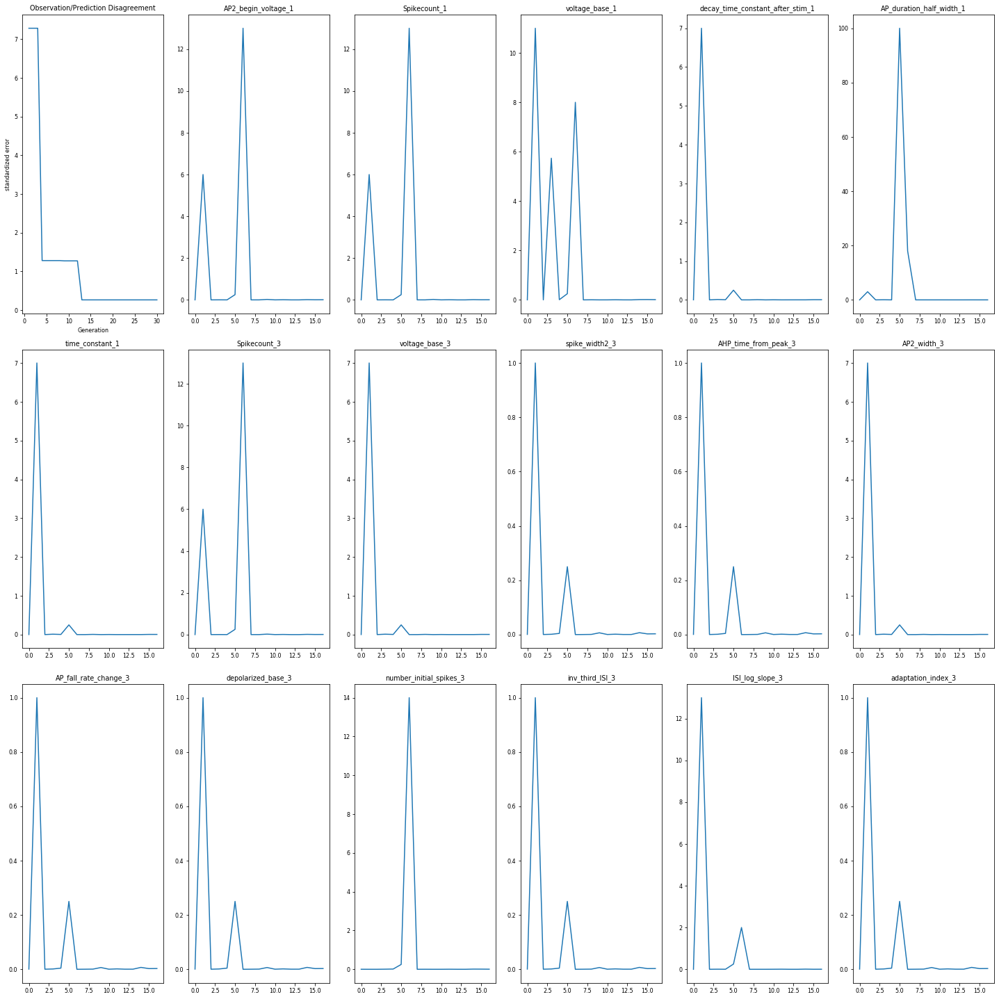

In [23]:
import math

fig,axes = plt.subplots(3,6,figsize=(20,20))#math.ceil(len(objectives)/2+1),figsize=(20,20))
#axes[0,0].plot(scores)
axes[0,0].plot(gen_numbers, min_fitness, label='min fitness')

axes[0,0].set_title('Observation/Prediction Disagreement')
for i,c in enumerate(df2.columns):
    ax = axes.flat[i+1]
    history = df2[c]
    #mn = mean[k.name] 
    #st = std[k.name] 
    #history = [(j[i]-mn)/st for j in scores ]
    #ax.axhline(y=mn , xmin=0.02, xmax=0.99,color='red',label='best candidate sampled')

    #ax.axvline(x=min_x , ymin=0.02, ymax=0.99,color='blue',label='best candidate sampled')
    ax.plot(history)
    ax.set_title(str(c))
    #bigger = np.max([np.max(history),mn])
    #smaller = np.max([np.min(history),mn])

    #ax.set_ylim([np.min(history),np.max(history)])
    #ax.set_ylabel(str(front[0].dtc.tests[i].observation['std'].units))
axes[0,0].set_xlabel("Generation")
axes[0,0].set_ylabel("standardized error")

plt.tight_layout()
#if figname is not None:
#    plt.savefig(figname)
#else:
plt.show()

INFO:numexpr.utils:NumExpr defaulting to 4 threads.


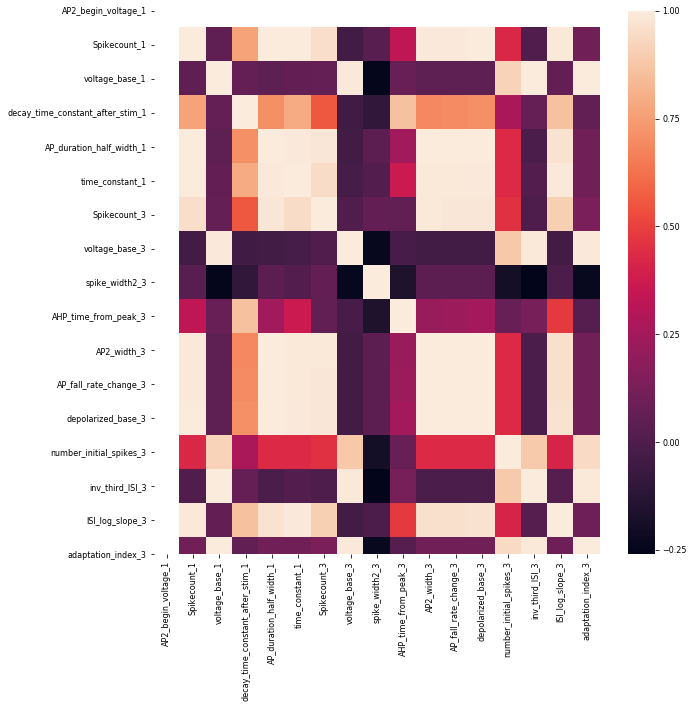

In [26]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)


    
#if normalize:
#    a = (a - mean(a)) / (std(a) * len(a))
#    v = (v - mean(v)) /  std(v)

df1=(df1-df1.mean())/df1.std()

corr = df1.corr()#.normalize()
fig =plt.figure(figsize=(10,10))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)#, annot=True)
plt.show()